# Intrinsic Optical Imaging - Orientation and Spatial Freqency

## Choose Dataset

In [2]:
using Interact
droot = "../VLABDataExport";rroot = "../Result"
sdir = dropdown(filter!(x->!startswith(x,"."),readdir(droot)),label="Subject")
exfile = map(x->dropdown(readdir("$droot/$x"),label="Experiment"),observe(sdir))
oifile = map(x->dropdown(readdir("$droot/$x"),label="OIBlock"),observe(sdir))
hbox(sdir,exfile,oifile)

(div { style=Dict("display"=>"flex","flex-direction"=>"row") }
  (div { className="field" }
        (div { style=Dict("display"=>"flex","flex-direction"=>"column") }
      "Subject"
      (div { className="select " }
        (select { attributes=Dict{Union{String, Symbol},Any}(Symbol("data-bind")=>"options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder") }))))
  (Scope("scope-c93a60c6-ffe1-4435-b3fe-f7c4c86e6d98", Node{WebIO.ObservableNode}(WebIO.ObservableNode("ob_37", "obs-scope"), Any[], Dict{Symbol,Any}(), 0), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("obs-scope"=>(Observable{Node{WebIO.DOM}} with 1 listeners. Value:
Node{DOM}(DOM(:html, :div), Any[Scope("knockout-component-3409161a-6452-4736-8c7b-95fea699cbbe", Node{DOM}(DOM(:html, :div), Any["Experiment", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :select), Any[], Dict{Symbol,Any}(:attributes=>Dict{Union{String, Symbol},Any}(Symbol("data-bind")=>"options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder")), 0)], Dict{Symbol,Any}(:className=>"select "), 1)], Dict{Symbol,Any}(:style=>Dict("display"=>"flex","flex-direction"=>"column")), 3), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("options_js"=>(Observable{Any} with 1 listeners. Value:
OrderedDict[OrderedDict{String,Any}("key"=>"C1701_fluoro_1.bmp","val"=>1,"id"=>"idBBEKsGaX"), OrderedDict{String,Any}("key"=>"C1701_fluoro_2.bmp","val"=>2,"id"=>"idQSTtWEbU"), OrderedDict{String,Any}("key"=>"C1701_fluoro_3.bmp","val"=>3,"id"=>"idks7sNdd3"), OrderedDict{String,Any}("key"=>"C1701_fluoro_4.bmp","val"=>4,"id"=>"idqWW8yOmB"), OrderedDict{String,Any}("key"=>"C1701_fluoro_5.bmp","val"=>5,"id"=>"idz7wYJEvL"), OrderedDict{String,Any}("key"=>"C1701_fluoro_6.bmp","val"=>6,"id"=>"idVO1RG28F"), OrderedDict{String,Any}("key"=>"C1701_fluoro_7.bmp","val"=>7,"id"=>"idAIcP39Jj"), OrderedDict{String,Any}("key"=>"C1701_ref_LH_bloodpattern1.bmp","val"=>8,"id"=>"id86GmSeIM"), OrderedDict{String,Any}("key"=>"C1701_ref_LH_bloodpattern2.bmp","val"=>9,"id"=>"idgI2BtzKq"), OrderedDict{String,Any}("key"=>"C1701_ref_LH_bloodpattern3.bmp","val"=>10,"id"=>"idkGnhrGDH"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_1.mat","val"=>11,"id"=>"ideups8QbA"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_2.mat","val"=>12,"id"=>"iddzBYpIjZ"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_3.mat","val"=>13,"id"=>"idfiQuXm6h"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_4.mat","val"=>14,"id"=>"idMLdS6kI4"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_5.mat","val"=>15,"id"=>"idw0VGy4z9"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_6.mat","val"=>16,"id"=>"idvaNULzIf"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Diameter_7.mat","val"=>17,"id"=>"idQ2ImRAgY"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Image_1.mat","val"=>18,"id"=>"idNFd3upeK"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_Image_2.mat","val"=>19,"id"=>"id6S0lipas"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_OriGrating_1.mat","val"=>20,"id"=>"idJTs8dbmr"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_OriGrating_2.mat","val"=>21,"id"=>"idpvxaNrbw"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_OriGrating_3.mat","val"=>22,"id"=>"idxW7gdw7L"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_OriOffsetGrating_1.mat","val"=>23,"id"=>"idfHSocMni"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_OriOffsetGrating_2.mat","val"=>24,"id"=>"id0ryRkEfg"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_RFBarX4Deg_1.mat","val"=>25,"id"=>"idVPM7MGc2"), OrderedDict{String,Any}("key"=>"C1701_V2Site1_3000Ch21_RFBarX4Deg_2.mat","val"=>26,"id"=>"id75B24ffl"), OrderedDict{String,Any}("key"=>"C

## Prepare Dataset

In [6]:
using Revise, NeuroAnalysis, DataFrames
dataset = prepare("$droot/$(sdir[])/$(exfile[][])");ex=dataset["ex"];cond = ex["Cond"]
oifiles = getoifile(subject=ex["Subject_ID"],experimentid=match(r"E([0-9]+)B",oifile[][]).captures[1],dir="$droot/$(sdir[])",adddir=true)
image=DataFrame(source=oifiles)
dataset["image"]=image;

## Analyze OI Response

In [8]:
nbaseframes = slider(0:2,value=1,label="nbaseframes")

Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 1 listeners. Value:
1), Observable{Int64} with 1 listeners. Value:
1, Scope("knockout-component-ad2dddc2-dd05-497c-a9b0-1999a6363e0e", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["nbaseframes"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>2,:min=>0,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 1 listeners. Value:
1, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":1}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-ad2dddc2-dd05-497c-a9b0-1999a6363e0e\",\"id\":\"ob_50\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-ad2dddc2-dd05-497c-a9b0-1999a6363e0e\",\"id\":\"ob_49\",\"type\":\"observable\"},val)) : undefined; retur

In [9]:
using ProgressMeter
stimuli = Any[];response=Any[]
p = ProgressMeter.Progress(size(image,1),1,"Read and Analyze OI Block ...",50)
for i in image[:source]
    block = prepare(i)
    nframesperstim = block["imagehead"]["nframesperstim"]
    baseframeindex = nbaseframes[]<=0 ? nothing : 1:nbaseframes[]
    frameindex = nbaseframes[]<=0 ? nothing : nbaseframes[]+1:nframesperstim
    push!(stimuli,block["imagehead"]["listofstimuli"])
    push!(response,oiframeresponse(block["image"],frameindex=frameindex,baseframeindex=baseframeindex))

    if !haskey(dataset,"imagehead")
        dataset["imagehead"]=block["imagehead"]  
    end
    next!(p)
end
image[:stimuli] = stimuli;image[:response] = response;

Read and Analyze OI Block ...100%|██████████████████████████████████████████████████| Time: 0:05:26


In [10]:
blockfl = unique(cond["SpatialFreq"])
condblock = [findall(cond["SpatialFreq"].==sf) for sf in blockfl]
sigma1 = slider(0.1:0.1:100.0,value=2.0,label="DoG σ1")
sigma2 = slider(0.1:0.1:100.0,value=60.0,label="DoG σ2")
vbox(sigma1,sigma2)

(div { style=Dict("display"=>"flex","flex-direction"=>"column") }
  (div { className="field" }
        (div { attributes=Dict("style"=>"display:flex; justify-content:center; align-items:center;") }
      (div { attributes=Dict("style"=>"text-align:right;width:18%") }
        (label { className="interact " style=Dict{Any,Any}(:padding=>"5px 10px 0px 10px") }
          "DoG σ1"))
      (div { attributes=Dict("style"=>"flex-grow:1; margin: 0 2%") }
        (input { max=1000 min=1 attributes=Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal") step=1 className="slider slider is-fullwidth" style=Dict{Any,Any}() }))
      (div { attributes=Dict("style"=>"width:18%") }
        (p { attributes=Dict("data-bind"=>"text: formatted_value") }))))
  (div { className="field" }
        (div { attributes=Dict("style"=>"display:flex; justify-content:center; align-items:center;") }
      (div { attributes=Dict("style"=>"text-align:right;width:18%") }
        (label { className="interact " style=Dict{Any,Any}(:padding=>"5px 10px 0px 10px") }
          "DoG σ2"))
      (div { attributes=Dict("style"=>"flex-grow:1; margin: 0 2%") }
        (input { max=1000 min=1 attributes=Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal") step=1 className="slider slider is-fullwidth" style=Dict{Any,Any}() }))
      (div { attributes=Dict("style"=>"width:18%") }
        (p { attributes=Dict("data-bind"=>"text: formatted_value") })))))

In [11]:
using Images
filter1 = Kernel.DoG((sigma1[],sigma1[]),(sigma2[],sigma2[]),(ceil(Int,sigma2[]*4)+1,ceil(Int,sigma2[]*4)+1))
blank,cocktail,responsemap,oimap = oiresponse(response,stimuli,stimuligroup=condblock,filter=filter1,sdfactor=3);

## Blank Response

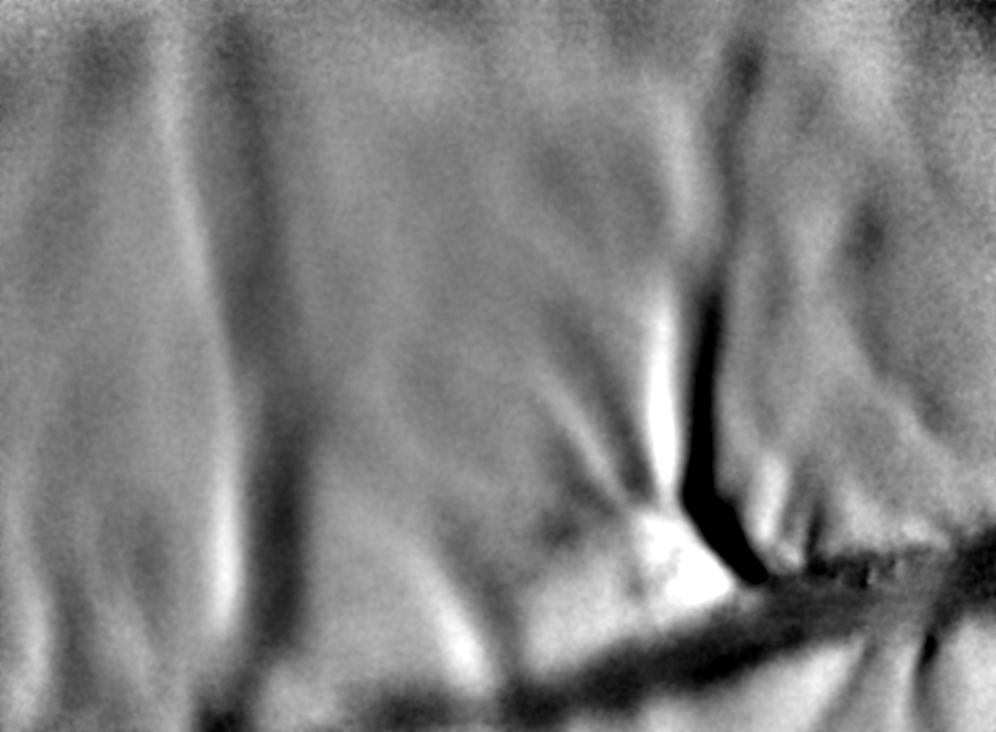

In [12]:
resultmaps=Set()
Gray.(clampscale(blank,3))

## Cocktail Response

In [11]:
@manipulate for blockindex=1:length(cocktail)
    Gray.(clampscale(cocktail[blockindex],3))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-382da2d4-2017-4433-861b-394477c4d31e", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-382da2d4-2017-4433-861b-394477c4d31e\",\"id\":\"ob_62\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-382da2d4-2017-4433-861b-394477c4d31e\",\"id\":\"ob_61\",\

## Stimuli Response

In [12]:
@manipulate for sid=1:size(oimap,1)
    Gray.(clampscale(oimap[:map][sid],3))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:sid=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
13), Observable{Int64} with 2 listeners. Value:
13, Scope("knockout-component-085c7019-d911-4153-8677-42c12ebea6eb", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["sid"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>25,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
13, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":13}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-085c7019-d911-4153-8677-42c12ebea6eb\",\"id\":\"ob_69\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-085c7019-d911-4153-8677-42c12ebea6eb\",\"id\":\"ob_68\",\"type\":\

## Stimuli/Blank Response

In [13]:
@manipulate for sid=1:size(responsemap,1)
    Gray.(clampscale(responsemap[:blankmap][sid],3))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:sid=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
12), Observable{Int64} with 2 listeners. Value:
12, Scope("knockout-component-6485aa3c-cb01-415d-9b96-39282bbfedc2", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["sid"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>24,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
12, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":12}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-6485aa3c-cb01-415d-9b96-39282bbfedc2\",\"id\":\"ob_76\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-6485aa3c-cb01-415d-9b96-39282bbfedc2\",\"id\":\"ob_75\",\"type\":\

## Stimuli/Cocktail Response

In [14]:
@manipulate for sid=1:size(responsemap,1)
    Gray.(clampscale(responsemap[:cocktailmap][sid],3))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:sid=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
12), Observable{Int64} with 2 listeners. Value:
12, Scope("knockout-component-f9bf0541-1507-4a4b-8287-9efcddf60e4e", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["sid"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>24,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
12, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":12}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-f9bf0541-1507-4a4b-8287-9efcddf60e4e\",\"id\":\"ob_83\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-f9bf0541-1507-4a4b-8287-9efcddf60e4e\",\"id\":\"ob_82\",\"type\":\

## Color Map

In [15]:
maptype = togglebuttons([:cocktailmap,:blankmap,:map],label="Map Type")
sigma1 = slider(0.1:0.1:100.0,value=13.0,label="DoG σ1")
sigma2 = slider(0.1:0.1:100.0,value=50.0,label="DoG σ2")
vbox(maptype,sigma1,sigma2)

(div { style=Dict("display"=>"flex","flex-direction"=>"column") }
  (div { className="field" }
        (div { attributes=Dict("style"=>"display:flex; justify-content:center; align-items:center;") }
      (div { attributes=Dict("style"=>"text-align:right;width:18%") }
        (label { className="interact " style=Dict{Any,Any}(:padding=>"5px 10px 0px 10px") }
          "Map Type"))
      (div { attributes=Dict("style"=>"flex-grow:1; margin: 0 2%") }
        (div { attributes="data-bind" => "foreach : options_js" className="field is-grouped has-addons is-oneline is-centered" }
          (button { attributes=Dict("data-bind"=>"click: function () {\$root.index(val)}, css: {'is-primary is-selected' : \$root.index() == val, 'button is-fullwidth' : true}") }
            (label { attributes=Dict("data-bind"=>"text : key") }))))
      (div { attributes=Dict("style"=>"width:18%") }
        (div))))
  (div { className="field" }
        (div { attributes=Dict("style"=>"display:flex; justify-content:center; align-items:center;") }
      (div { attributes=Dict("style"=>"text-align:right;width:18%") }
        (label { className="interact " style=Dict{Any,Any}(:padding=>"5px 10px 0px 10px") }
          "DoG σ1"))
      (div { attributes=Dict("style"=>"flex-grow:1; margin: 0 2%") }
        (input { max=1000 min=1 attributes=Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal") step=1 className="slider slider is-fullwidth" style=Dict{Any,Any}() }))
      (div { attributes=Dict("style"=>"width:18%") }
        (p { attributes=Dict("data-bind"=>"text: formatted_value") }))))
  (div { className="field" }
        (div { attributes=Dict("style"=>"display:flex; justify-content:center; align-items:center;") }
      (div { attributes=Dict("style"=>"text-align:right;width:18%") }
        (label { className="interact " style=Dict{Any,Any}(:padding=>"5px 10px 0px 10px") }
          "DoG σ2"))
      (div { attributes=Dict("style"=>"flex-grow:1; margin: 0 2%") }
        (input { max=1000 min=1 attributes=Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal") step=1 className="slider slider is-fullwidth" style=Dict{Any,Any}() }))
      (div { attributes=Dict("style"=>"width:18%") }
        (p { attributes=Dict("data-bind"=>"text: formatted_value") })))))

In [16]:
filter2 = Kernel.DoG((sigma1[],sigma1[]),(sigma2[],sigma2[]),(ceil(Int,sigma2[]*4)+1,ceil(Int,sigma2[]*4)+1))
cammaps=map(i->oicomplexmap(responsemap[maptype[]][i],cond["Ori"][responsemap[:stimuli][i]],isangledegree=true,isangleinpi=true,
        filter=filter2,presdfactor=3,sufsdfactor=3),condblock);

### Angle Map

In [17]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("anglemap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=map(a->HSV(rad2deg(a),1,1),cammaps[blockindex[]]["angle"])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-ce660832-c3e9-4cbd-96ac-dfdc42ea1779", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-ce660832-c3e9-4cbd-96ac-dfdc42ea1779\",\"id\":\"ob_105\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-ce660832-c3e9-4cbd-96ac-dfdc42ea1779\",\"id\":\"ob_104\"

### Polar Map

In [18]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("polarmap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),cammaps[blockindex[]]["angle"],cammaps[blockindex[]]["abs"])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-b2354dc2-aae2-4bd4-a879-13b74b1a6a0d", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-b2354dc2-aae2-4bd4-a879-13b74b1a6a0d\",\"id\":\"ob_112\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-b2354dc2-aae2-4bd4-a879-13b74b1a6a0d\",\"id\":\"ob_111\"

### Stimuli Color Codes

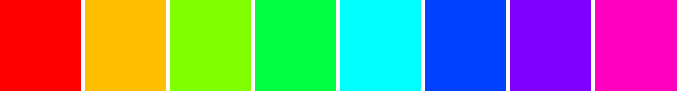

Widget{:tabs,Any}(OrderedDict{Symbol,Any}(:options=>Observable{Array{Any,1}} with 2 listeners. Value:
Any[0.0, 22.5, 45.0, 67.5, 90.0, 112.5, 135.0, 157.5],:index=>Observable{Any} with 2 listeners. Value:
1,:vals2idxs=>Observable{Any} with 1 listeners. Value:
Any[0.0, 22.5, 45.0, 67.5, 90.0, 112.5, 135.0, 157.5]), Observable{Any} with 1 listeners. Value:
0.0, Scope("knockout-component-3f863069-7752-4472-930a-9b0d8eb39ca0", Node{WebIO.DOM}(WebIO.DOM(:html, :ul), Any[Node{DOM}(DOM(:html, :li), Any[Node{DOM}(DOM(:html, :label), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text : key")), 0)], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"click: function () {\$root.index(val)}, css: {'is-active' : \$root.index() == val, 'not-active not-active' : true}")), 1)], Dict{Symbol,Any}(:attributes=>("data-bind"=>"foreach : options_js"),:className=>"tabs"), 2), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("options_js"=>(Observable{Any} with 1 listeners. Value:
OrderedDict[OrderedDict{String,Any}("key"=>0.0,"val"=>1,"id"=>"idoJ8lGusr"), OrderedDict{String,Any}("key"=>22.5,"val"=>2,"id"=>"ideGWUu7aq"), OrderedDict{String,Any}("key"=>45.0,"val"=>3,"id"=>"iddjh2W8Ne"), OrderedDict{String,Any}("key"=>67.5,"val"=>4,"id"=>"idYnptBwtH"), OrderedDict{String,Any}("key"=>90.0,"val"=>5,"id"=>"idoB8oguNY"), OrderedDict{String,Any}("key"=>112.5,"val"=>6,"id"=>"idvuKDa7xR"), OrderedDict{String,Any}("key"=>135.0,"val"=>7,"id"=>"idaIlRqZnE"), OrderedDict{String,Any}("key"=>157.5,"val"=>8,"id"=>"idhktRmHoM")], nothing),"index"=>(Observable{Any} with 2 listeners. Value:
1, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"options_js\\\":[{\\\"key\\\":0.0,\\\"val\\\":1,\\\"id\\\":\\\"idoJ8lGusr\\\"},{\\\"key\\\":22.5,\\\"val\\\":2,\\\"id\\\":\\\"ideGWUu7aq\\\"},{\\\"key\\\":45.0,\\\"val\\\":3,\\\"id\\\":\\\"iddjh2W8Ne\\\"},{\\\"key\\\":67.5,\\\"val\\\":4,\\\"id\\\":\\\"idYnptBwtH\\\"},{\\\"key\\\":90.0,\\\"val\\\":5,\\\"id\\\":\\\"idoB8oguNY\\\"},{\\\"key\\\":112.5,\\\"val\\\":6,\\\"id\\\":\\\"idvuKDa7xR\\\"},{\\\"key\\\":135.0,\\\"val\\\":7,\\\"id\\\":\\\"idaIlRqZnE\\\"},{\\\"key\\\":157.5,\\\"val\\\":8,\\\"id\\\":\\\"idhktRmHoM\\\"}],\\\"index\\\":1}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"

In [19]:
theta=cammaps[1]["rad"];fl=cammaps[1]["deg"]
display(HSV.(rad2deg.(theta),1,1))
tabs(fl)

### Angle Domain Map

In [20]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("angledomainmap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),cammaps[blockindex[]]["angle"])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-aa4a863d-06e7-4180-8a7d-cc9d105bf9f1", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-aa4a863d-06e7-4180-8a7d-cc9d105bf9f1\",\"id\":\"ob_124\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-aa4a863d-06e7-4180-8a7d-cc9d105bf9f1\",\"id\":\"ob_123\"

### Polar Domain Map

In [21]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("polardomainmap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),cammaps[blockindex[]]["angle"],cammaps[blockindex[]]["abs"])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-341e01fb-9124-4752-a978-03d06ba6e7fe", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-341e01fb-9124-4752-a978-03d06ba6e7fe\",\"id\":\"ob_131\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-341e01fb-9124-4752-a978-03d06ba6e7fe\",\"id\":\"ob_130\"

### Mean Map

In [22]:
mamap,mmmap=angleabs(mapreduce(i->i["complex"],+,cammaps));

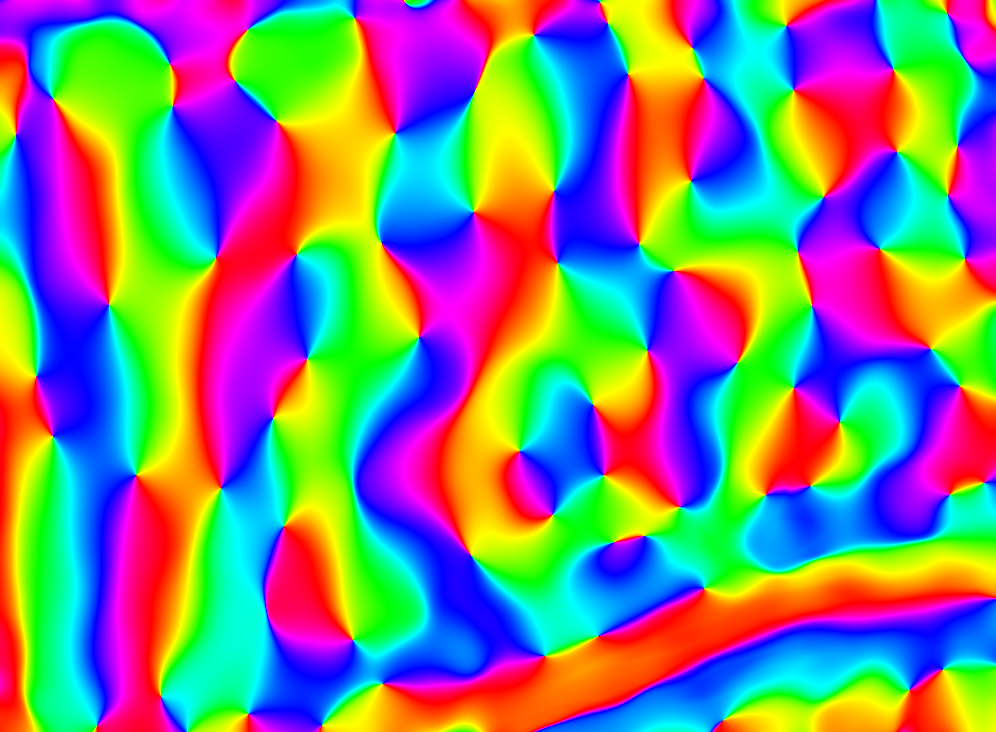

In [23]:
mapname = Symbol("anglemap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(a),1,1),mamap)))

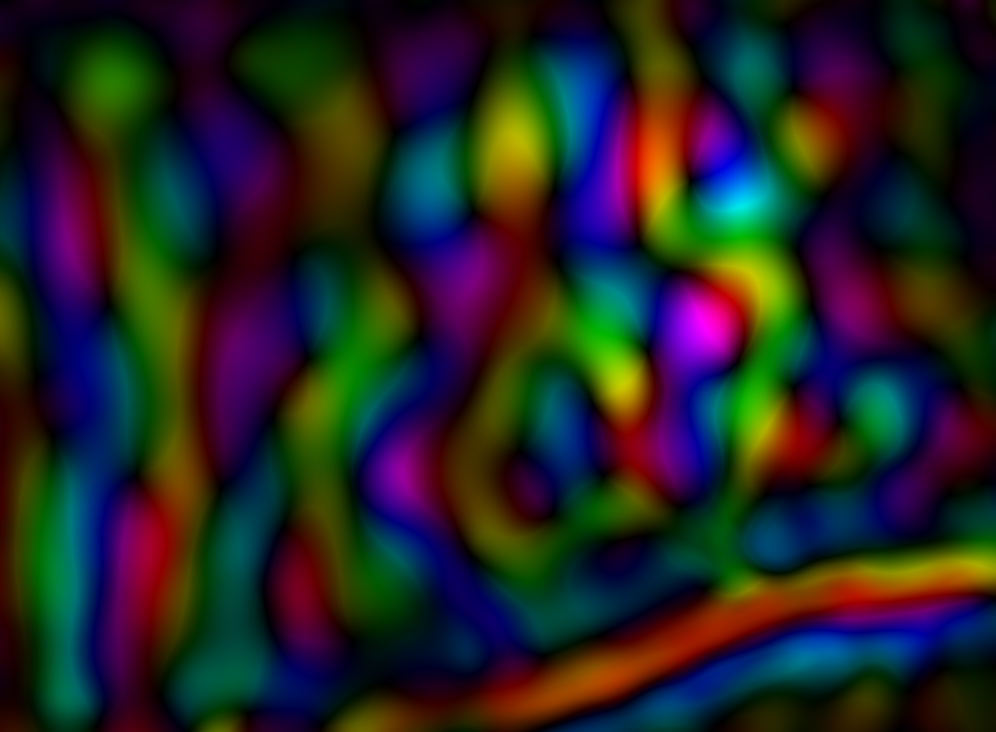

In [24]:
mapname = Symbol("polarmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(a),1,m),mamap,mmmap)))

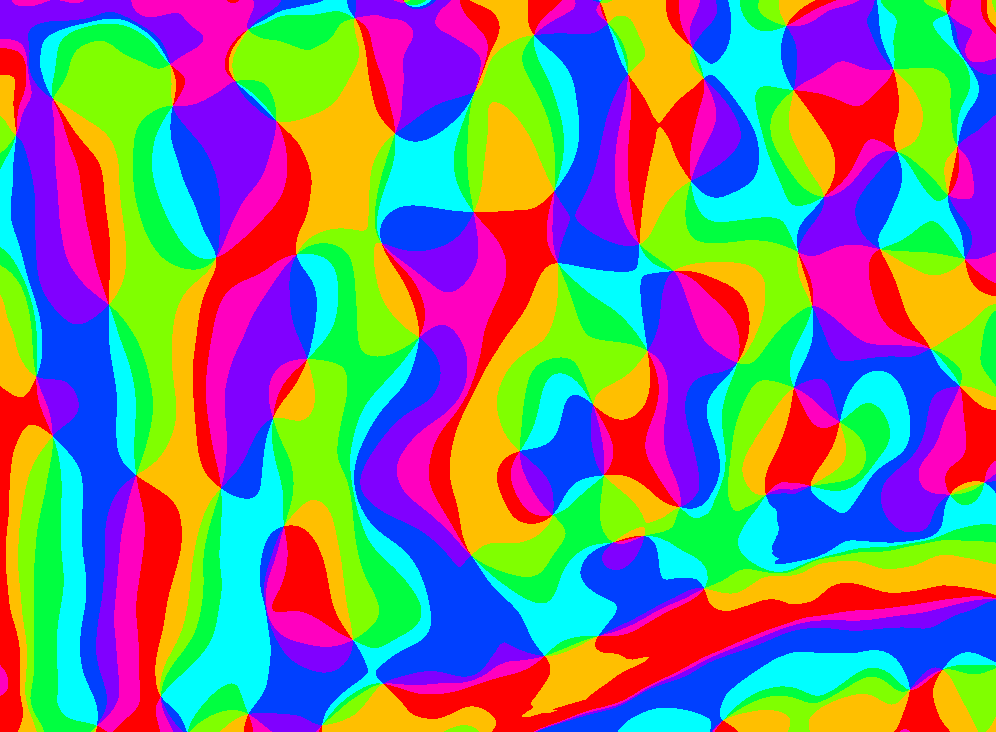

In [25]:
mapname = Symbol("angledomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map(a->HSV(rad2deg(anglemode(a,theta)),1,1),mamap)))

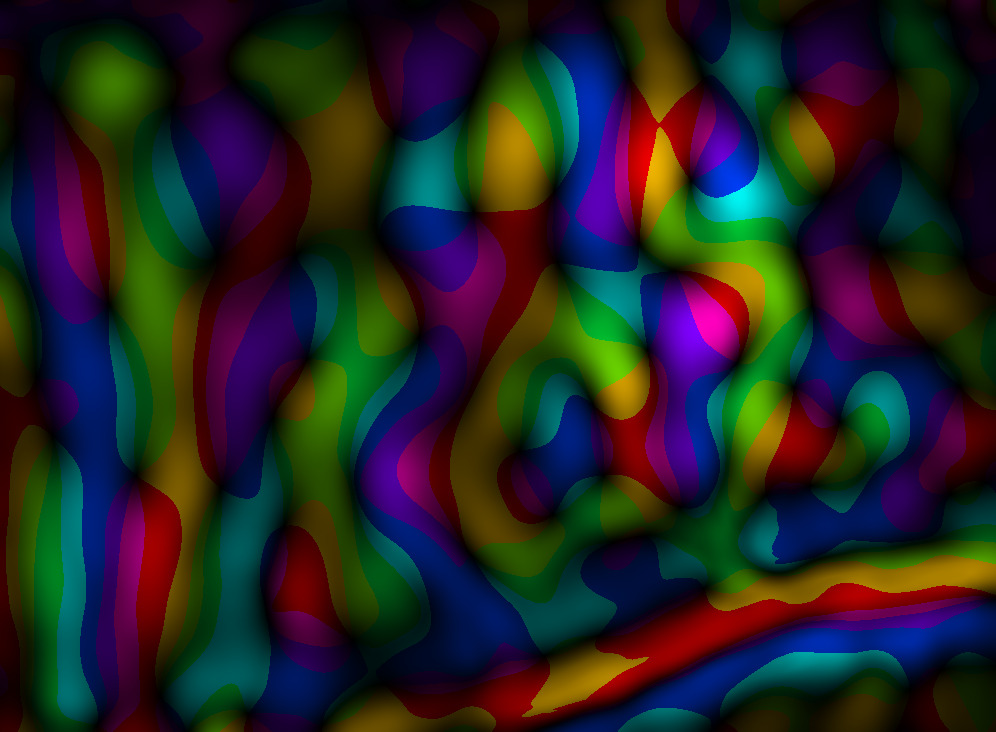

In [26]:
mapname = Symbol("polardomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=map((a,m)->HSV(rad2deg(anglemode(a,theta)),1,m),mamap,mmmap)))

### Diff Map

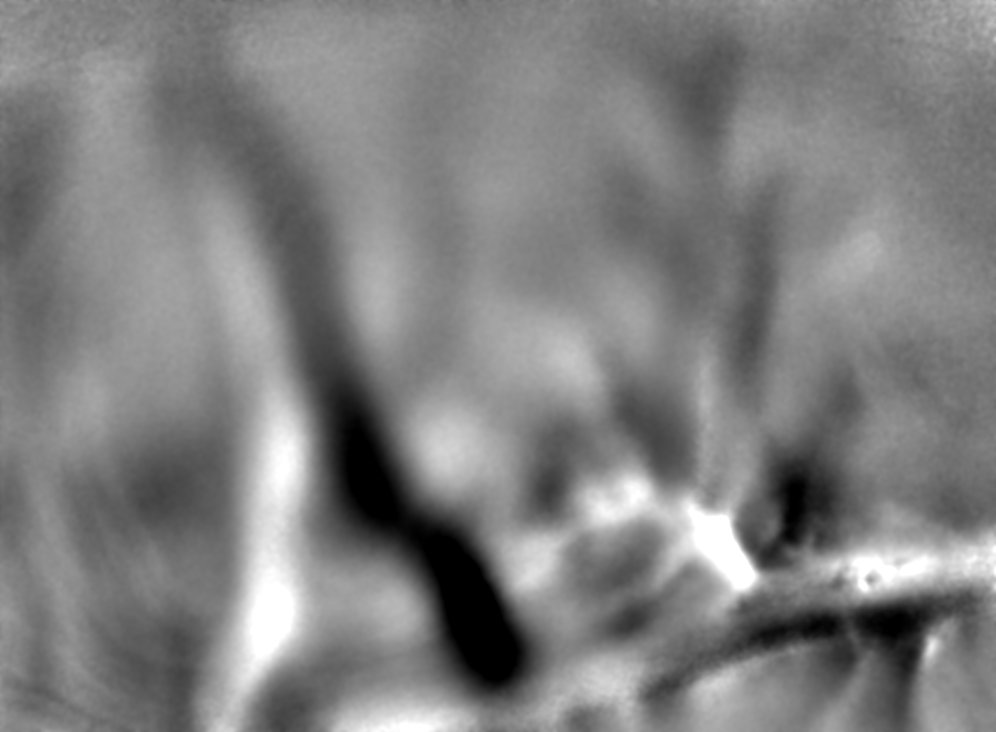

In [27]:
Gray.(clampscale(cocktail[1]./cocktail[3],3))

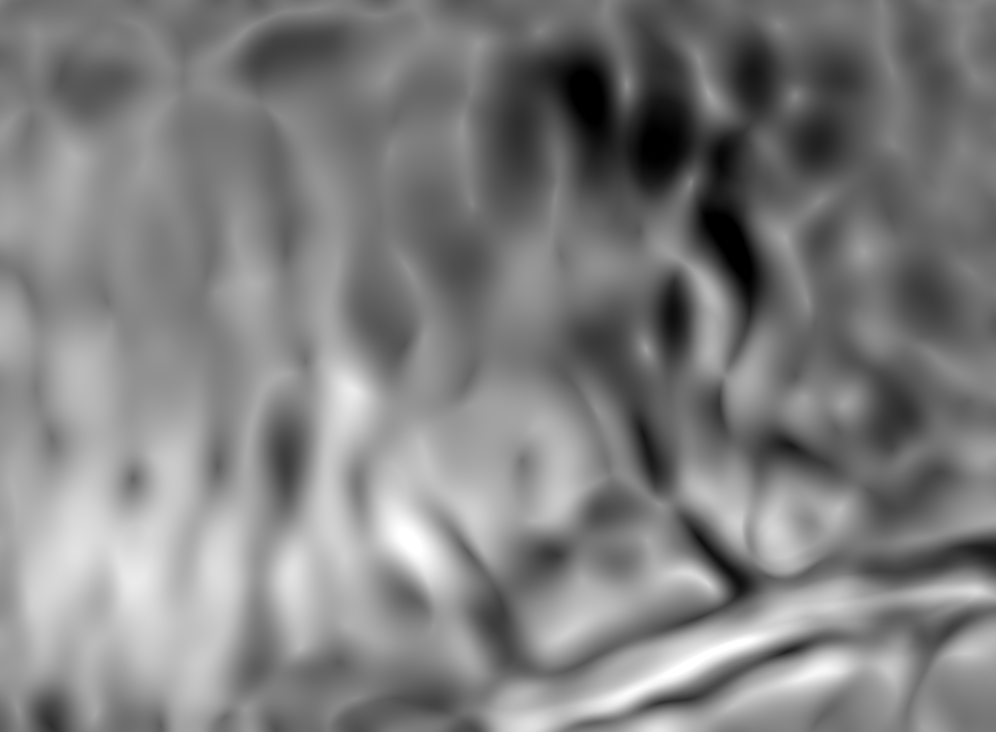

In [28]:
Gray.(clampscale(cammaps[1]["abs"]-cammaps[3]["abs"],3))

# Align Map

In [29]:
oireffile = map(x->dropdown(filter!(x->!endswith(x,"mat"),readdir("$droot/$x")),label="OIReference"),observe(sdir))

Observable{Any} with 0 listeners. Value:
Widget{:dropdown,Any}(OrderedDict{Symbol,Any}(:options=>Observable{Any} with 2 listeners. Value:
["C1801_E0_map0_0.bmp", "C1801_E0_map0_1.bmp", "C1801_E0_map0_2.bmp", "C1801_E0_map0_3.bmp", "C1801_E0_map0_4.bmp", "C1801_E0_map0_5.bmp", "C1801_E0_map0_6.bmp", "C1801_E0_map0_7.bmp", "C1801_E1_map1_0.bmp", "C1801_E1_map1_1.bmp"  …  "ref_fluo1.bmp", "ref_fluo1_roi1x1.bmp", "ref_fluo_v1.bmp", "ref_fluo_v1_1.bmp", "ref_fluo_v1_1_roi1x1.bmp", "ref_fluo_v1_roi1x1.bmp", "ref_roi1x1.bmp", "singletrial_mcherry.png", "singletrial_mcherry_V1.png", "Thumbs.db"],:index=>Observable{Any} with 2 listeners. Value:
1), Observable{Any} with 1 listeners. Value:
"C1801_E0_map0_0.bmp", Scope("knockout-component-5a8a2b43-149d-43b6-b4ef-95f45324f196", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["OIReference", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :select), Any[], Dict{Symbol,Any}(:attributes=>Dict{Union{String, Symbol},Any}(Symbol("data-bind")=>"options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder")), 0)], Dict{Symbol,Any}(:className=>"select "), 1)], Dict{Symbol,Any}(:style=>Dict("display"=>"flex","flex-direction"=>"column")), 3), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("options_js"=>(Observable{Any} with 1 listeners. Value:
OrderedDict[OrderedDict{String,Any}("key"=>"C1801_E0_map0_0.bmp","val"=>1,"id"=>"idgwbS9IzO"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_1.bmp","val"=>2,"id"=>"iddUr6buzQ"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_2.bmp","val"=>3,"id"=>"idn4ifNaAb"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_3.bmp","val"=>4,"id"=>"idtRygIIzZ"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_4.bmp","val"=>5,"id"=>"idJkXW96YR"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_5.bmp","val"=>6,"id"=>"ids6ku0e6L"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_6.bmp","val"=>7,"id"=>"idAPGEMd1H"), OrderedDict{String,Any}("key"=>"C1801_E0_map0_7.bmp","val"=>8,"id"=>"idwnXzoded"), OrderedDict{String,Any}("key"=>"C1801_E1_map1_0.bmp","val"=>9,"id"=>"idxRMwUNOh"), OrderedDict{String,Any}("key"=>"C1801_E1_map1_1.bmp","val"=>10,"id"=>"id3Ogm4HNe")  …  OrderedDict{String,Any}("key"=>"ref_fluo1.bmp","val"=>20,"id"=>"idASLo3STN"), OrderedDict{String,Any}("key"=>"ref_fluo1_roi1x1.bmp","val"=>21,"id"=>"idIJkHAzvU"), OrderedDict{String,Any}("key"=>"ref_fluo_v1.bmp","val"=>22,"id"=>"idwAupuKG5"), OrderedDict{String,Any}("key"=>"ref_fluo_v1_1.bmp","val"=>23,"id"=>"idrRUz3Rpq"), OrderedDict{String,Any}("key"=>"ref_fluo_v1_1_roi1x1.bmp","val"=>24,"id"=>"idobbR0fOI"), OrderedDict{String,Any}("key"=>"ref_fluo_v1_roi1x1.bmp","val"=>25,"id"=>"idMcMInH8S"), OrderedDict{String,Any}("key"=>"ref_roi1x1.bmp","val"=>26,"id"=>"id0AN9xfW9"), OrderedDict{String,Any}("key"=>"singletrial_mcherry.png","val"=>27,"id"=>"idcABy27Io"), OrderedDict{String,Any}("key"=>"singletrial_mcherry_V1.png","val"=>28,"id"=>"id2AO8yEXl"), OrderedDict{String,Any}("key"=>"Thumbs.db","val"=>29,"id"=>"idKTTwejnJ")], nothing),"index"=>(Observable{Any} with 2 listeners. Value:
1, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(fu

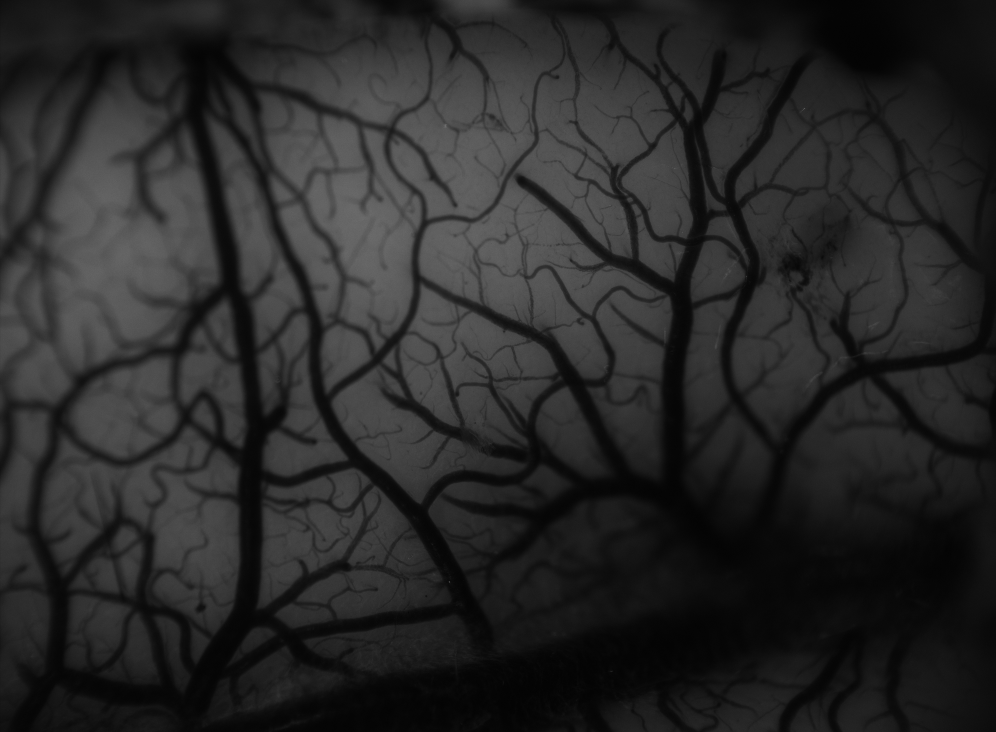

In [30]:
oiref = load("$droot/$(sdir[])/$(oireffile[][])")

In [31]:
alpha = slider(0:0.01:1,value=0.6,label="Map Alpha")

Widget{:slider,Float64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:index=>Observable{Any} with 2 listeners. Value:
61,:formatted_vals=>Observable{Any} with 1 listeners. Value:
["0.0", "0.01", "0.02", "0.03", "0.04", "0.05", "0.06", "0.07", "0.08", "0.09"  …  "0.91", "0.92", "0.93", "0.94", "0.95", "0.96", "0.97", "0.98", "0.99", "1.0"],:formatted_value=>Observable{String} with 1 listeners. Value:
"0.6",:value=>Observable{Float64} with 1 listeners. Value:
0.6), Observable{Float64} with 1 listeners. Value:
0.6, Scope("knockout-component-45985b6e-ff7b-48eb-9142-32d0c402f4e1", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["Map Alpha"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>101,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: formatted_value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("formatted_vals"=>(Observable{Any} with 1 listeners. Value:
["0.0", "0.01", "0.02", "0.03", "0.04", "0.05", "0.06", "0.07", "0.08", "0.09"  …  "0.91", "0.92", "0.93", "0.94", "0.95", "0.96", "0.97", "0.98", "0.99", "1.0"], nothing),"changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"formatted_value"=>(Observable{String} with 1 listeners. Value:
"0.6", nothing),"index"=>(Observable{Any} with 2 listeners. Value:
61, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("formatted_vals"=>Any[JSString("(function (val){return (val!=this.model[\"formatted_vals\"]()) ? (this.valueFromJulia[\"formatted_vals\"]=true, this.model[\"formatted_vals\"](val)) : undefined})")],"_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"formatted_va

In [32]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("oirefblendpolarmap_SF$(blockfl[blockindex[]])")
    blendname = Symbol("polarmap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha[])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-0268374a-432c-42a2-818a-909e8c0b90ac", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-0268374a-432c-42a2-818a-909e8c0b90ac\",\"id\":\"ob_151\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-0268374a-432c-42a2-818a-909e8c0b90ac\",\"id\":\"ob_150\"

In [33]:
@manipulate for blockindex=1:length(blockfl)
    mapname = Symbol("oirefblendangledomainmap_SF$(blockfl[blockindex[]])")
    blendname = Symbol("angledomainmap_SF$(blockfl[blockindex[]])")
    push!(resultmaps,mapname)
    eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha[])))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:blockindex=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:value=>Observable{Int64} with 2 listeners. Value:
2), Observable{Int64} with 2 listeners. Value:
2, Scope("knockout-component-b4279994-f7fc-4057-8861-91c984d1ac49", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["blockindex"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>3,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"value"=>(Observable{Int64} with 2 listeners. Value:
2, nothing)), Set(String[]), nothing, Any["knockout"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout.js", "knockout_punches"=>"C:\\Users\\Alex\\.julia\\packages\\Knockout\\JIqpG\\src\\..\\assets\\knockout_punches.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\all.js", "C:\\Users\\Alex\\.julia\\packages\\InteractBase\\Q4IkI\\src\\..\\assets\\style.css", "C:\\Users\\Alex\\.julia\\packages\\InteractBulma\\Ohu5Y\\src\\..\\assets\\main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":2}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (_webIOScope.setObservableValue({\"name\":\"changes\",\"scope\":\"knockout-component-b4279994-f7fc-4057-8861-91c984d1ac49\",\"id\":\"ob_158\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\"value\"].subscribe((function (val){!(this.valueFromJulia[\"value\"]) ? (_webIOScope.setObservableValue({\"name\":\"value\",\"scope\":\"knockout-component-b4279994-f7fc-4057-8861-91c984d1ac49\",\"id\":\"ob_157\"

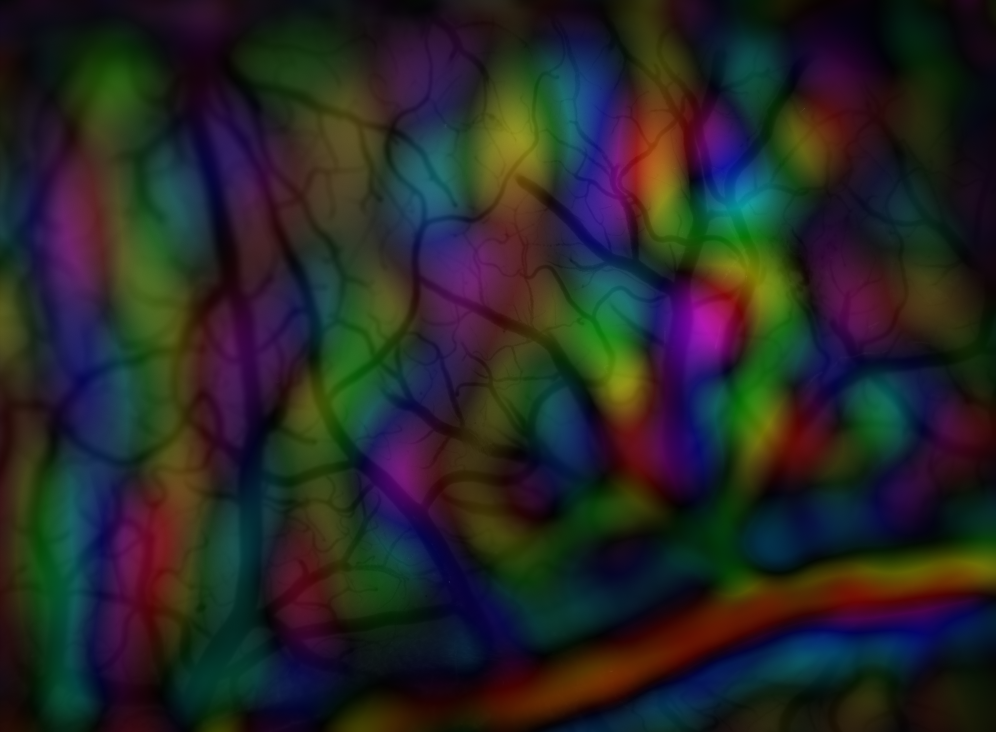

In [34]:
mapname = Symbol("oirefblendpolarmap_mean")
blendname = Symbol("polarmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha[])))

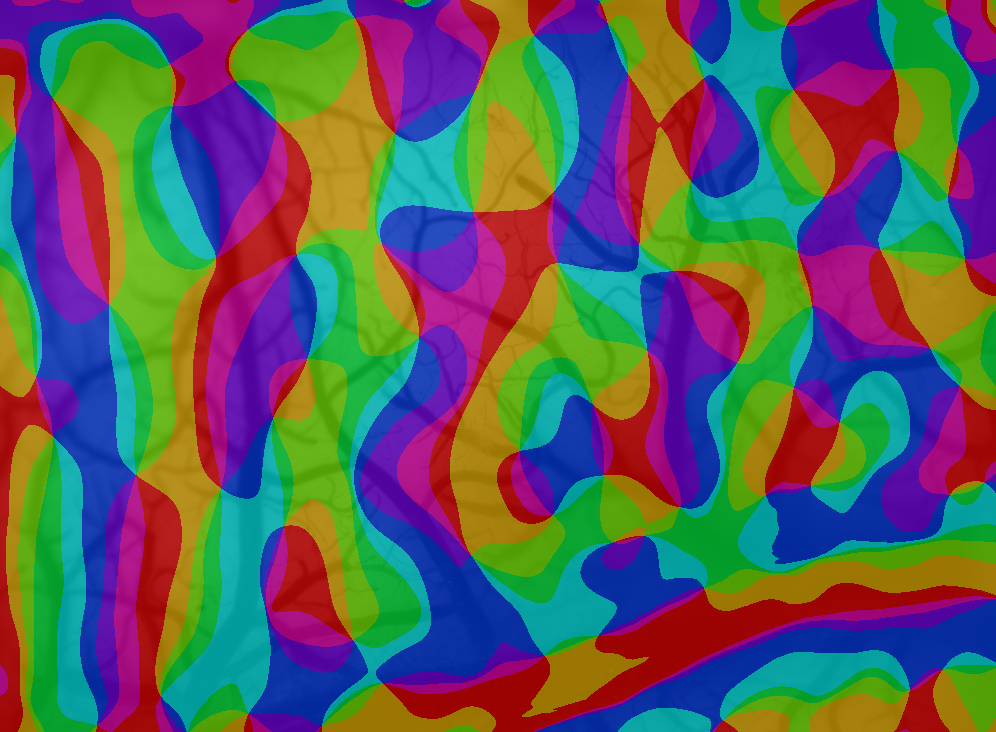

In [35]:
mapname = Symbol("oirefblendangledomainmap_mean")
blendname = Symbol("angledomainmap_mean")
push!(resultmaps,mapname)
eval(:($mapname=alphablend.(RGB.($blendname),oiref,alpha[])))

# Save Results

In [36]:
rdir = "$rroot/$(sdir[])"
rfhead = splitext(exfile[][])[1]
isdir(rdir) || mkdir(rdir)
eval.(:(save("$rdir/$(rfhead)_"*$(string(i))*".png",$i)) for i in resultmaps);